**Authors:**  Jose Gomez, Oscar Narvaez, Max Aragon <br>
**Affiliation:** Department of Geoinformatics, University of Salzburg <br>
**Copyright:** Ⓒ 2022 <br>
**License:** MIT

<div class="alert alert-block alert-success">
<h1><center>Cloud Cover spatiotemporal prediction using deep learning</center></h1>

<center><a href='https://notebook.wekeo.eu/'> 
    <img src='https://www.copernicus.eu/sites/default/files/inline-images/Picture2_21.png' width="500"> 
</a></center>

<hr>

# Introduction

In this Jupyter Notebook you will learn how to query ERA5 and Sentinel-3 data from WEkEO, explore it, and pre-process it for predicting the spatiotemporal variability of total cloud cover over France.

### Data

| Product Description | WEkEO HDA ID | WEkEO metadata |
|:--------------------:|:-----------------:|:-----------------:|
| Sentinel-3 OLCI level-2 | EO:ESA:DAT:SENTINEL-3:OL_2_LFR___ | <a href="https://www.wekeo.eu/data?view=dataset&dataset=EO%3AESA%3ADAT%3ASENTINEL-3%3AOL_2_LFR___" target="_blank">link</a> |
| ERA5 | EO:ECMWF:DAT:REANALYSIS_ERA5_SINGLE_LEVELS | <a href='https://www.wekeo.eu/data?view=dataset&dataset=EO%3AECMWF%3ADAT%3AREANALYSIS_ERA5_SINGLE_LEVELS' target='blank'>link</a> |

### Data description

[ERA5](https://cds.climate.copernicus.eu/cdsapp#!/dataset/reanalysis-era5-single-levels?tab=overview) is a reanalysis dataset providing hourly estimates of a large number of atmospheric, land and oceanic climate variables. The data covers the Earth on a 30km grid and resolve the atmosphere using 137 levels from the surface up to a height of 80km. ERA5 includes information about uncertainties for all variables at reduced spatial and temporal resolutions.

From this dataset we use the Total Cloud Cover (TCC) estimation. This parameter is the proportion of a grid box covered by cloud. Total cloud cover is a single level field calculated from the cloud occurring at different model levels through the atmosphere. Assumptions are made about the degree of overlap/randomness between clouds at different heights. Cloud fractions vary from 0 to 1.

In addition, we use [Sentinel-3 Ocean and Land Colour Instrument (OLCI)](https://sentinels.copernicus.eu/web/sentinel/user-guides/sentinel-3-olci) cloud mask product to compare TCC values. OLCI has a resolution of 300m which is 100 times more detailed than ERA5, thus allowing us to evaluate the performance of the reanalysis with finer observations. 


### Hold on, what's a climate reanalysis?

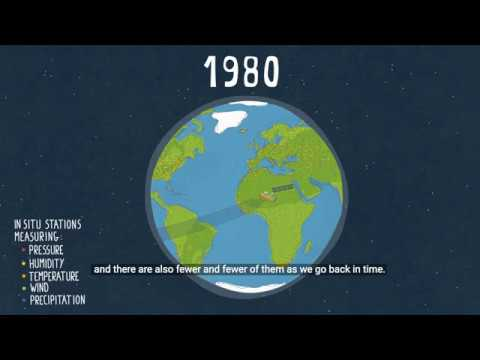

In [1]:
from IPython.display import YouTubeVideo

YouTubeVideo('FAGobvUGl24', width=800, height=450)

In [11]:
ls data/S3

S3B_20220412/  S3B_20220509/  S3B_20220605/  S3B_20220729/


<div class="alert alert-info" role="alert">

## <a id='TOC_TOP'></a>Contents

* [Data access and download](#chapter1)
    * [Importing libraries](#section_1_1)
    * [Creating and sending download query](sSection_1_2)
* [Data Exploration and pre processing](#chapter2)
    * [Importing libraries](#section_2_1)
    * [Loading data](#section_2_2)
    * [Plotting temporal data](#section_2_3)
    * [Plotting geographical data](#section_2_4)
    * [Animating spatio-temporal data](#section_2_5)
* [Next-frame prediction](#chapter3)
    * [Importing libraries](#section_3_1)
    * [Defining the model](sSection_3_2)
    * [Tranning the model](sSection_3_3)
    * [Making predictions](sSection_3_4)



## Data access and download <a class="anchor" id="chapter1"></a>


### Importing libraries <a class="anchor" id="section_1_1"></a>


We will use the Harmonized Data Access service to search and download our data. For this, Wekeo has created a python client for the API which makes this process easier. Next we will import that Client, define the query json and send a request for downlading ERA5 TCC data. Currently this data is provided world-wide, so it must be cropped according to a specific AOI. 

In [3]:
import hda # Wekeo's python Client for HDA 
import os # To manage folder basic operations
import zipfile # to unzip files
from datetime import datetime # Python datetime library

### ERA5 download query <a class="anchor" id="section_1_2"></a>


Next we need to define a JSON: a dictionary of data to comunicate with the API. This JSON contains information such as ERA5 collection ID, our variable of interest and the time range we look for. In the following block we generate lists of years, months and days to facilitate hanlding. For this example we will use hourly data from 2017 to 2021, including all months of the year. We will also define the directory in which we want the data to be downloaded.

In [7]:
#Sequences for years, months and days, note that you need to add one unit to the desired number.
Years=list(map(str,range(2017,2022,1))) 
months=list(map(str,range(1,13,1)))
days=list(map(str,range(1,31,1)))
# Working dir (download data)
workdir='.'

In [4]:
Years #How the years sequence looks like

['2017', '2018', '2019', '2020', '2021']

In [5]:
query = {
  "datasetId": "EO:ECMWF:DAT:REANALYSIS_ERA5_SINGLE_LEVELS", # This is the ID of ERA5 dataset.

  "multiStringSelectValues": [
    {
      "name": "variable",
      "value": [
        "total_cloud_cover" # The name of our variable of interest.
      ]
    },
    {
      "name": "product_type",
      "value": [
        "reanalysis"
      ]
    },
    {
      "name": "year",
      "value": Years # We use the generated lists to fill these fields.
    },
    {
      "name": "month",
      "value": months
    },
    {
      "name": "day",
      "value": days
    },
    {
      "name": "time",
      "value": [
        "00:00",
        "01:00",
        "02:00",
        "03:00",
        "04:00",
        "05:00",
        "06:00",
        "07:00",
        "08:00",
        "09:00",
        "10:00",
        "11:00",
        "12:00",
        "13:00",
        "14:00",
        "15:00",
        "16:00",
        "17:00",
        "18:00",
        "19:00",
        "20:00",
        "21:00",
        "22:00",
        "23:00"
      ]
    }
  ],
  "stringChoiceValues": [
    {
      "name": "format",
      "value": "netcdf"
    }
  ]
}

<div class="alert alert-block alert-warning">
<b>Warning:</b> To create the client instance, you must have an .hdarc file with your credentials in your home directory. If you don't have it or want to be sure, run the following lines. You can also use them to update credentials.
</div>

In [6]:
username=''
password=''
HOME=os.environ['HOME']
fileString=(f'url: https://wekeo-broker.apps.mercator.dpi.wekeo.eu/databroker \nuser: {username} \npassword: {password}')
file_path=os.path.join(HOME,'.hdarc')
if os.path.exists(file_path):
    os.remove(file_path)
with open(file_path,'w') as f:
    f.write(fileString)

Now we create an hda client instance and pass the query. The next bock will search for the data and download it to your working directory, it migth take long as it will only stop when all the data is downloaded.

In [8]:
dir_name = workdir + '/data/ERA5' #for example, with c being working directory '/home/john/COFFEE'
if os.path.isdir(dir_name):
    if not os.listdir(dir_name):
        c=hda.Client(debug=True)  # Creating the client
        matches=c.search(query) # Looking for data based on query json
        os.chdir(workdir)
        matches.download() # Actually making the download
    else:    
        print("the ERA5 data has already been downloaded")
else:
    print("the given directory doesn't exist")

the ERA5 data has already been downloaded


### Sentinel-3 OLCI download query

In [9]:
query_202207 = {
    "datasetId": "EO:ESA:DAT:SENTINEL-3:OL_2_LFR___",
    "boundingBoxValues": [{"name": "bbox","bbox": [0.8592794892475406,46.05897584821409,4.208065051226144,48.04894076163025]}],
    "dateRangeSelectValues": [{"name": "position", "start": "2022-07-29T10:00:00.000Z","end": "2022-07-29T10:02:00.000Z"}],
    "stringChoiceValues": [{"name": "productType","value": "LFR"},{"name": "processingLevel","value": "LEVEL2"},{"name": "timeliness","value": "Near+Real+Time"},{"name": "orbitDirection","value": "descending"}]
}

query_202206 = {
    "datasetId": "EO:ESA:DAT:SENTINEL-3:OL_2_LFR___",
    "boundingBoxValues": [{"name": "bbox","bbox": [0.8592794892475406,46.05897584821409,4.208065051226144,48.04894076163025]}],
    "dateRangeSelectValues": [{"name": "position", "start": "2022-06-05T10:00:00.000Z","end": "2022-06-05T10:02:00.000Z"}],
    "stringChoiceValues": [{"name": "productType","value": "LFR"},{"name": "processingLevel","value": "LEVEL2"},{"name": "timeliness","value": "Near+Real+Time"},{"name": "orbitDirection","value": "descending"}]
}

query_202205 = {
    "datasetId": "EO:ESA:DAT:SENTINEL-3:OL_2_LFR___",
    "boundingBoxValues": [{"name": "bbox","bbox": [0.8592794892475406,46.05897584821409,4.208065051226144,48.04894076163025]}],
    "dateRangeSelectValues": [{"name": "position", "start": "2022-05-09T10:00:00.000Z","end": "2022-05-09T10:02:00.000Z"}],
    "stringChoiceValues": [{"name": "productType","value": "LFR"},{"name": "processingLevel","value": "LEVEL2"},{"name": "timeliness","value": "Near+Real+Time"},{"name": "orbitDirection","value": "descending"}]
}

query_202204 = {
    "datasetId": "EO:ESA:DAT:SENTINEL-3:OL_2_LFR___",
    "boundingBoxValues": [{"name": "bbox","bbox": [0.8592794892475406,46.05897584821409,4.208065051226144,48.04894076163025]}],
    "dateRangeSelectValues": [{"name": "position", "start": "2022-04-12T09:59:00.000Z","end": "2022-04-12T10:02:00.000Z"}],
    "stringChoiceValues": [{"name": "productType","value": "LFR"},{"name": "processingLevel","value": "LEVEL2"},{"name": "timeliness","value": "Near+Real+Time"},{"name": "orbitDirection","value": "descending"}]
}

queries = [query_202207, query_202206, query_202205, query_202204]

In [9]:
c=hda.Client(debug=True)

dir_name = workdir + '/data/S3'
if os.path.isdir(dir_name):
    if not os.listdir(dir_name):
        for query in queries:
            matches = c.search(query)
            matches.download()
            for match in matches.results:
                fdst = match['filename']
                print(f"Found: {fdst}")        
                with zipfile.ZipFile(fdst, 'r') as zip_ref:
                    zip_ref.extractall(path)
                    print(f'Unzipping of product {fdst} finished.')
                os.remove(fdst)
    else:    
        print("the S3 data has already been downloaded")
else:
    print("the given directory doesn't exist")

2022-09-04 12:53:10,376 DEBUG HDA {'url': 'https://wekeo-broker.apps.mercator.dpi.wekeo.eu/databroker', 'token': None, 'user': '', 'password': '', 'quiet': False, 'verify': True, 'timeout': None, 'sleep_max': 120, 'retry_max': 500, 'progress': True}


the S3 data has already been downloaded


## Data exploration and pre-processing <a class="anchor" id="chapter1"></a>


### Importing libraries <a class="anchor" id="section_2_1"></a>


For this section we will use libraries to work with multidimensional data arrays stored in netCDF4 format. We will also use some packages to plot them and create maps.

<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
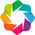

In [54]:
# To work with multidimentional arrays
import netCDF4
import xarray as xr
import numpy

# To create plots and maps
import plotly.graph_objects as go
import plotly.io as pio
pio.renderers.default = "jupyterlab"

import matplotlib.pyplot as plt
import matplotlib.colors
from matplotlib.cm import get_cmap
from matplotlib import animation
from matplotlib.axes import Axes

from shapely import geometry, vectorized
import eumartools

import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
import cartopy.feature as cfeature
from cartopy.mpl.geoaxes import GeoAxes
GeoAxes._pcolormesh_patched = Axes.pcolormesh

import holoviews as hv
from holoviews import opts, dim

import geoviews as gv
import geoviews.feature as gf
from cartopy import crs
gv.extension('bokeh')

from IPython.display import HTML
import coffee

import logging
logger = logging.getLogger()
logger.setLevel(logging.CRITICAL)


Aditionally we will make use of `visualize_pcolormesh` function to plot a multidimentional array and plot it into a map.

In [34]:
roi =  [[-30.0, 30.0], [-30.0, 60.0], [30.0, 60.0], [30.0, 30.0], [-30.0, 30.0]]

# Read in the coordinate data and build a spatial mask
geo_fid = xr.open_dataset('data/S3/S3B_20220412/geo_coordinates.nc')
lat = geo_fid.get('latitude').data
lon = geo_fid.get('longitude').data
geo_fid.close()

# Now check the flag content for our polygon
flag_file = os.path.join('data/S3/S3B_20220412/lqsf.nc')
flag_variable = 'LQSF'
flags_to_use = ['CLOUD']
flag_mask = eumartools.flag_mask(flag_file, flag_variable, flags_to_use)

point_mask = vectorized.contains(geometry.Polygon(roi), lon,lat)

/home/jegomezg/.conda-libs/coffee/lib/python3.9/site-packages/cartopy/mpl/geoaxes.py:1797: UserWarning:

The input coordinates to pcolormesh are interpreted as cell centers, but are not monotonically increasing or decreasing. This may lead to incorrectly calculated cell edges, in which case, please supply explicit cell edges to pcolormesh.



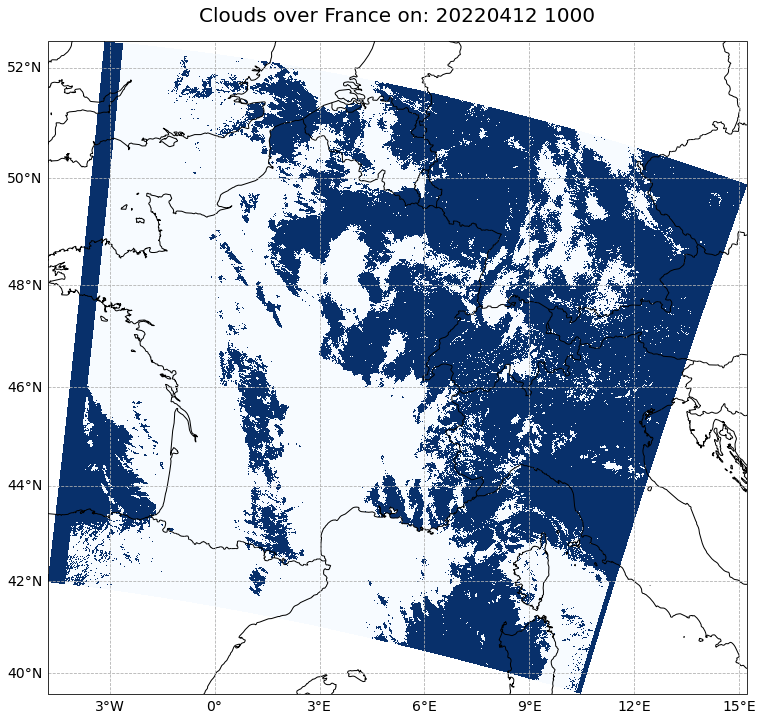

In [35]:
date = geo_fid.attrs['product_name'][16:24]
time = geo_fid.attrs['product_name'][25:29]; 

coffee.geoviz_s3(flag_mask, lat, lon, 'Clouds over France on: ' + date + ' ' + time)

### Loading data <a class="anchor" id="section_2_2"></a>


Xarray extends numpy structures to handle labeled data. It makes easy to work with coordinates, attributes and multiple dimensions which makes them a powerful tool to hanlde temporal gridded geographical data. For example we can easly subset the worldwide data downladed to a specific AOI based on geographic coordinates. For our exampe the data is already crop, but a example is given on how to subset a non-croped dataset.

<div class="alert alert-block alert-info">
<b>Tip:</b> Sometimes the dataset may be too large and need to be downloaded in multiple parts. If that's the case, the following lines of code will open all the .nc files in a folder as an array and save them to a new file merged.nc
</div>

In [36]:
data = xr.open_mfdataset(os.path.join(workdir,'*nc'),combine = 'nested', concat_dim="time")
merged_file='data/ERA5/merged.nc'
if not os.path.exists(merged_file):
    data.to_netcdf('data/ERA5/merged.nc')
    data=data.tcc
else:
    print('Data already merged')
    data=xr.open_dataset('data/ERA5/merged.nc')
    data=data.tcc



Data already merged


As you can see the dataset has a size deterimed for its dimentions. It as 38184 depth which is every hour of the time range. Spatially it as  a size of 55 x 55, representing a longitude langiitude squere over France. 

In [8]:
data

<xarray.DataArray 'tcc' (time: 38184, latitude: 55, longitude: 55)>
[115506600 values with dtype=float32]
Coordinates:
  * longitude  (longitude) float32 -4.75 -4.5 -4.25 -4.0 ... 8.0 8.25 8.5 8.75
  * latitude   (latitude) float32 53.75 53.5 53.25 53.0 ... 40.75 40.5 40.25
  * time       (time) datetime64[ns] 2017-01-01 ... 2021-11-29T23:00:00
Attributes:
    units:          (0 - 1)
    long_name:      Total cloud cover
    standard_name:  cloud_area_fraction

One of the main advantages of xarray is the ability to access and subset data based on spatial or temporal coordinates. The next block uses a spatial subset and creates a new array containing only information about our AOI. You can uhe folowing lines to crop a dataset to a given dataset to aspecific area. In our case it will not make any difference as the dataset is already cropped. To establish the AOI just change the limits of longitude and latitude.


In [9]:
file_assigned = data.assign_coords(longitude=(((data.longitude + 180) % 360) - 180)).sortby('longitude')
data=file_assigned.where((file_assigned.latitude < 54) & (file_assigned.latitude > 40) & (file_assigned.longitude < 9) & (file_assigned.longitude > -5),drop=True)

In [10]:
data

<xarray.DataArray 'tcc' (time: 38184, latitude: 55, longitude: 55)>
array([[[1.        , 1.        , 1.        , ..., 1.        ,
         1.        , 1.        ],
        [1.        , 1.        , 1.        , ..., 1.        ,
         1.        , 1.        ],
        [1.        , 1.        , 1.        , ..., 1.        ,
         1.        , 1.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.4014008 ,
         0.25619155, 0.17907009],
        [0.        , 0.        , 0.        , ..., 0.3730792 ,
         0.21612012, 0.17455328],
        [0.00418109, 0.13876978, 0.13867822, ..., 0.23958921,
         0.20723909, 0.16553491]],

       [[1.        , 1.        , 1.        , ..., 1.        ,
         1.        , 1.        ],
        [1.        , 1.        , 1.        , ..., 1.        ,
         1.        , 1.        ],
        [1.        , 1.        , 1.        , ..., 1.        ,
         1.        , 1.        ],
...
        [0.65115285, 0.43555155, 0.3980132 , ..., 0.4758061 ,
         0.54708314, 0.56545556],
        [0.4882273 , 0.2716952 , 0.19957885, ..., 0.4841988 ,
         0.5534616 , 0.57867026],
        [0.23778859, 0.18282393, 0.12277785, ..., 0.4489799 ,
         0.5560557 , 0.5813559 ]],

       [[1.        , 1.        , 1.        , ..., 1.        ,
         1.        , 1.        ],
        [1.        , 1.        , 1.        , ..., 1.        ,
         1.        , 1.        ],
        [1.        , 1.        , 1.        , ..., 0.9998169 ,
         0.9998169 , 1.        ],
        ...,
        [0.70437795, 0.54049104, 0.43420872, ..., 0.45377138,
         0.54278   , 0.67501867],
        [0.5738178 , 0.40936628, 0.31152242, ..., 0.53313595,
         0.56731725, 0.6202371 ],
        [0.45856285, 0.34179726, 0.23583537, ..., 0.46674195,
         0.61770403, 0.6708376 ]]], dtype=float32)
Coordinates:
  * longitude  (longitude) float32 -4.75 -4.5 -4.25 -4.0 ... 8.0 8.25 8.5 8.75
  * latitude   (latitude) float32 53.75 53.5 53.25 53.0 ... 40.75 40.5 40.25
  * time       (time) datetime64[ns] 2017-01-01 ... 2021-11-29T23:00:00
Attributes:
    units:          (0 - 1)
    long_name:      Total cloud cover
    standard_name:  cloud_area_fraction

### Plotting temporal data <a class="anchor" id="section_2_3"></a>


It is possible to use the dimensional nature of xarray to perform operations on the data. For example, using temporal labeling we can calculate the mean TCC for each timestamp and analyze the corresponding time series to identify patterns and other behaviors of interest. Since we have very long time series, the use of interactive charts allows us to explore different time scales and move throughout the entire time window. You can check on the `create_timeseries` function to see how it works. Basically we pass the time information as x axis and the mean value over our AOI as y axis.


In [37]:
coffee.create_timeseries(x=list(data.time.values.astype('str')), y=list(data.mean(axis=(1,2)).values))


### Plotting geographical data <a class="anchor" id="section_2_4"></a>


Using the `visualize_colormesh` function, we can select a specific moment of interest and plot it on a reference map to analyze the spatial distribution of clouds in that particular snapshot.


(<Figure size 1440x720 with 2 Axes>,
 <GeoAxesSubplot:title={'center':'Total Cloud Cover 2017-01-01T01:00:00.000000000'}>)

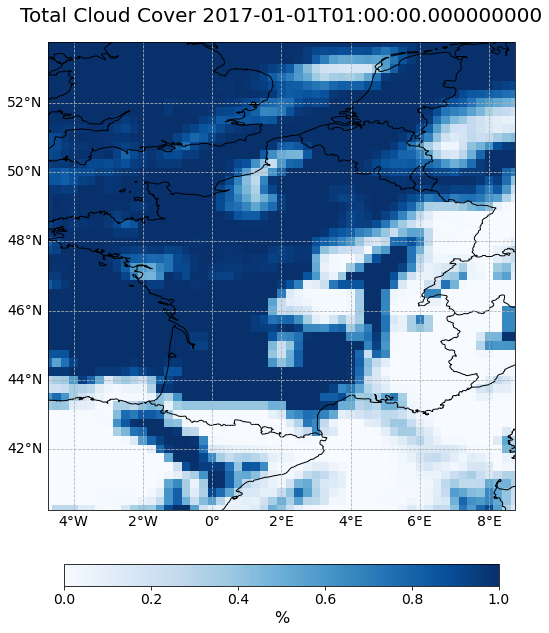

In [38]:
coffee.visualize_pcolormesh(data_array=data.sel(time='2017-01-01T02:00:00.000000000'),
                     longitude=data.longitude,
                     latitude=data.latitude,
                     projection=ccrs.PlateCarree(),
                     color_scale='Blues',
                     unit='%',
                     long_name= 'Total Cloud Cover ' + str(data.time.data[1]),
                     vmin=0, 
                     vmax=1,
                     lonmin=data.longitude.min().data,
                     lonmax=data.longitude.max().data,
                     latmin=data.latitude.min().data,
                     latmax=data.latitude.max().data,
                     set_global=False)

### Animating spatio-temporal data <a class="anchor" id="section_2_5"></a>



Going even further, we can use the temporal dimension of the data to create animations on temporal subsets. In this case, the data can be thought of as a video where every hour is a new frame. Using holoviz library we can browse along each frame. We choose the first week of the year. Longer time periods can be selected but it will demand more time and memory.


In [39]:
subset = data.sel(time=slice('2017-01-01T01:00:00.000000000', '2017-01-07T23:00:00.000000000'))
# Specify the dataset, its coordinates and requested variable 
dataset = gv.Dataset(subset.load(), ['longitude', 'latitude', 'time'], 'mag', crs=crs.PlateCarree())
images = dataset.to(gv.Image,dynamic=False)
# Slider location
hv.output(widget_location='bottom')
# Create stack of images grouped by time
images.opts(active_tools=['wheel_zoom', 'pan'], cmap=cmocean.cm.speed,colorbar=True, width=500, height=500, clim=(0.1,1.0))


:HoloMap   [time]
   :Image   [longitude,latitude]   (mag)

Now we want to transform the data in such a way that a deep learning model can handle it. For this we first convert the xarray into a numpy array, without labels where only the TCC values ​​are stored. This matrix has 3 dimensions: first the temporal one, in this case 38184, each of these corresponds to a different time, the remaining two dimensions correspond to the latitude-longitude grid.


In [40]:
tcc_array=data.to_numpy()
tcc_array.shape

(38184, 55, 55)

This means that, as it is, we have a single sequence, or video, of n hours or frames. For our case study, we will transform this in such a way that each day is just one video consisting of 24 frames. for this we remodel the array and the new dimensions are: number of dates, 24 hours and two dimensions for the geographic grid. Also. An added dimension is created for the grayscale nature of the images.


In [41]:
samples=int(len(data.time)/24)
dataset=tcc_array.reshape([samples,24,55,55])
dataset = numpy.expand_dims(dataset, axis=-1)
dataset.shape

(1591, 24, 55, 55, 1)

From the new reshaped dataset, select data to train and evaluate the model by randomly selecting 90% of the sequences to train and 10% to evaluate.


In [42]:
# Split into train and validation sets using indexing to optimize memory.
indexes = numpy.arange(dataset.shape[0])
numpy.random.shuffle(indexes)
train_index = indexes[: int(0.9 * dataset.shape[0])]
val_index = indexes[int(0.9 * dataset.shape[0]) :]
train_dataset = dataset[train_index]
val_dataset = dataset[val_index]

The model to be trained will predict the next frame of the video based on the previous one. If we consider $Y_t$ the frame to be predicted, we need a predictor $X_{t-1}$. This is defined in the create_shifted_frames function, which is then used to create  $X_{train}$, $Y_{train}$, $X_{validation}$ and $Y_{validation}$ datasets.

In [43]:
def create_shifted_frames(data):
    x = data[:, 0 : data.shape[1] - 1, :, :]
    y = data[:, 1 : data.shape[1], :, :]
    return x, y
x_train, y_train = create_shifted_frames(train_dataset)
x_val, y_val = create_shifted_frames(val_dataset)

The following code block randomly selects one of the training samples and plots its 24 frames.

Displaying frames for example 368.


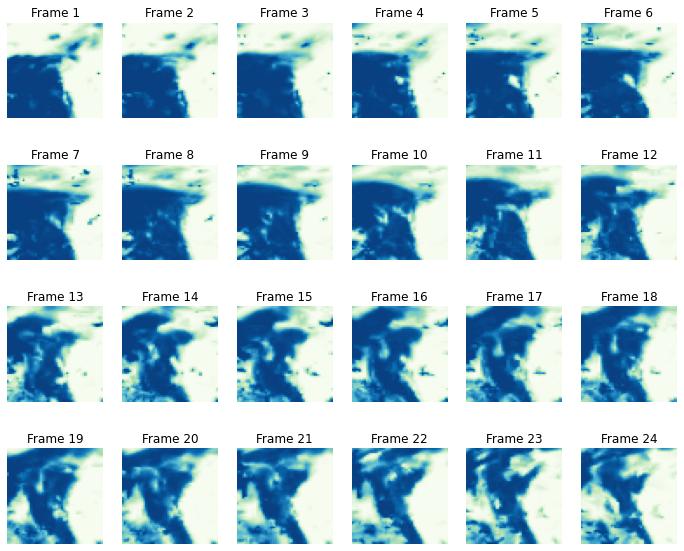

In [44]:
# Construct a figure on which we will visualize the images.
fig, axes = plt.subplots(4,6 , figsize=(12, 10))

# Plot each of the sequential images for one random data example.
data_choice = numpy.random.choice(range(len(train_dataset)), size=1)[0]
for idx, ax in enumerate(axes.flat):
    ax.imshow(numpy.squeeze(train_dataset[data_choice][idx]), cmap="GnBu")
    ax.set_title(f"Frame {idx + 1}")
    ax.axis("off")

# Print information and display the figure.
print(f"Displaying frames for example {data_choice}.")
plt.show()

### Next-frame prediction <a class="anchor" id="chapter3"></a>


### Importing libraries <a class="anchor" id="section_3_1"></a>


In [45]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import  save_model, load_model

import io
import imageio
from IPython.display import  display
from ipywidgets import widgets,  HBox


### Defining the model <a class="anchor" id="section_3_2"></a>


The basis of the model for this exercise is the ConvLSTM2D architecture (Shi et al. 2015) in keras implementation (https://keras.io/examples/vision/conv_lstm/) . This architecture is an extension of the type of short-term memory (LSTM) networks that are commonly used to process data streams, as it retains feedback connections. The main change in the ConvLSTM architectures is the way operations are performed on the spatial domain of the data, it is done through 2D convolutions instead of simple matrix operations. Additionally, Bathc normalization is used between layers to stabilize and speed up training. Finally, a Conv3D layer is introduced, which performs convolutions on volumes, to take into account the space-time nature of the outputs.


In [46]:
inp = layers.Input(shape=(None, *x_train.shape[2:]))

x = layers.ConvLSTM2D(
    filters=32,
    kernel_size=(5, 5),
    padding="same",
    return_sequences=True,
    activation="relu",
)(inp)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(
    filters=32,
    kernel_size=(3, 3),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
x = layers.BatchNormalization()(x)
x = layers.ConvLSTM2D(
    filters=32,
    kernel_size=(1, 1),
    padding="same",
    return_sequences=True,
    activation="relu",
)(x)
x = layers.Conv3D(
    filters=1, kernel_size=(3, 3, 3), activation="sigmoid", padding="same"
)(x)


model = keras.models.Model(inp, x)
model.compile(loss=keras.losses.MeanSquaredError(), optimizer=keras.optimizers.Adam(learning_rate=0.000001))

2022-09-04 10:28:02.360565: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2 AVX AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Tranning the model <a class="anchor" id="section_3_3"></a>


Before training the model, we define a stop early callback that will end training if the loss of model validations reaches a minimum value and stabilizes for 10 epochs. Training a Deep Learning model is always time and hardrware consuming. In this case we provide you with the necesary lines to train a new model but, to avoid this step, a pre-trained model is also given. The next block will train a model just if there is no model inside model folder

In [47]:
if os.path.exists('model/Model.h5'):
    print('Model already trained')
else:
    # Define some callbacks to improve training.
    early_stopping = keras.callbacks.EarlyStopping(monitor="val_loss", patience=10)

    # Define modifiable training hyperparameters.
    epochs = 100
    batch_size = 1

    # Fit the model to the training data.
    model.fit(x_train,
        y_train,
        epochs=epochs,
        validation_data=(x_val, y_val),
        callbacks=[early_stopping],
    )

Model already trained


After processing is complete, the model is saved to an h5 file that stores weights, architecture, and parameters in a single file.


In [48]:
if os.path.exists('model/Model.h5'):
    print('Model already saved')
else:
    save_model(model,workdir+'/model.h5')

Model already saved


### Making predictions <a class="anchor" id="section_3_4"></a>


The following code block randomly selects a sample from the validation dataset and predicts 12 final truth frames with the predicted ones.


In [49]:
model = load_model('model/Model.h5', compile = True)
model.summary()


Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, None, 55, 55, 1)  0         
                             ]                                   
                                                                 
 conv_lstm2d_3 (ConvLSTM2D)  (None, None, 55, 55, 32)  105728    
                                                                 
 batch_normalization_2 (Batc  (None, None, 55, 55, 32)  128      
 hNormalization)                                                 
                                                                 
 conv_lstm2d_4 (ConvLSTM2D)  (None, None, 55, 55, 32)  73856     
                                                                 
 batch_normalization_3 (Batc  (None, None, 55, 55, 32)  128      
 hNormalization)                                                 
                                                           

In [50]:
# Select a few random examples from the dataset.
examples = val_dataset[numpy.random.choice(range(len(val_dataset)), size=1)]

# Iterate over the examples and predict the frames.
predicted_videos = []
for example in examples:
    # Pick the first/last ten frames from the example.
    frames = example[:12, ...]
    original_frames = example[12:, ...]
    new_predictions = numpy.zeros(shape=(12, *frames[0].shape))

    # Predict a new set of 10 frames.
    for i in range(12):
        # Extract the model's prediction and post-process it.
        frames = example[: 12 + i + 1, ...]
        new_prediction = model.predict(numpy.expand_dims(frames, axis=0))
        new_prediction = numpy.squeeze(new_prediction, axis=0)
        predicted_frame = numpy.expand_dims(new_prediction[-1, ...], axis=0)

        # Extend the set of prediction frames.
        new_predictions[i] = predicted_frame

    # Create and save GIFs for each of the ground truth/prediction images.
    for frame_set in [original_frames, new_predictions]:
        # Construct a GIF from the selected video frames.
        current_frames = numpy.squeeze(frame_set)
        current_frames = current_frames[..., numpy.newaxis] * numpy.ones(3)
        current_frames = (current_frames * 255).astype(numpy.uint8)
        current_frames = list(current_frames)

        # Construct a GIF from the frames.
        with io.BytesIO() as gif:
            imageio.mimsave(gif, current_frames, "GIF", fps=5)
            predicted_videos.append(gif.getvalue())

# Display the videos.
print(" Truth\tPrediction")
for i in range(0, len(predicted_videos), 2):
    # Construct and display an `HBox` with the ground truth and prediction.
    box = HBox(
        [
            widgets.Image(value=predicted_videos[i],width=300,height=200),
            widgets.Image(value=predicted_videos[i + 1],width=300,height=200),
        ]
    )
    display(box)

1/1 [==============================] - 0s 280ms/step
 Truth	Prediction


Finally we use a date outside the original timelapse and make a prediction on it. You can download anay day you want for this. We provide you with a random date outside the time stamp

In [41]:
validation_date=xr.open_dataset('data/ERA5/validation.nc')
validation_date=data.tcc.to_numpy()
nvalidation_date = numpy.expand_dims(validation_date, axis=-1)


FileNotFoundError: [Errno 2] No such file or directory: b'/home/jegomezg/COFFEE/data/ERA5/validation.nc'

<div class="alert alert-block alert-info">
<b>Tip:</b> Remember that you can change the duration of the training and the expected frames.
</div>

In [48]:
# Select a few random examples from the dataset.
examples = [nvalidation_date]

# Iterate over the examples and predict the frames.
predicted_videos = []
for example in examples:
    # Pick the first/last ten frames from the example.
    frames = example[:12, ...]
    original_frames = example[12:, ...]
    new_predictions = numpy.zeros(shape=(12, *frames[0].shape))

    # Predict a new set of 10 frames.
    for i in range(12):
        # Extract the model's prediction and post-process it.
        frames = example[: 12 + i + 1, ...]
        new_prediction = model.predict(numpy.expand_dims(frames, axis=0))
        new_prediction = numpy.squeeze(new_prediction, axis=0)
        predicted_frame = numpy.expand_dims(new_prediction[-1, ...], axis=0)

        # Extend the set of prediction frames.
        new_predictions[i] = predicted_frame

    # Create and save GIFs for each of the ground truth/prediction images.
    for frame_set in [original_frames, new_predictions]:
        # Construct a GIF from the selected video frames.
        current_frames = numpy.squeeze(frame_set)
        current_frames = current_frames[..., numpy.newaxis] * numpy.ones(3)
        current_frames = (current_frames * 255).astype(numpy.uint8)
        current_frames = list(current_frames)

        # Construct a GIF from the frames.
        with io.BytesIO() as gif:
            imageio.mimsave(gif, current_frames, "GIF", fps=5)
            predicted_videos.append(gif.getvalue())

# Display the videos.
print(" Truth\tPrediction")
for i in range(0, len(predicted_videos), 2):
    # Construct and display an `HBox` with the ground truth and prediction.
    box = HBox(
        [
            widgets.Image(value=predicted_videos[i],width=300,height=200),
            widgets.Image(value=predicted_videos[i + 1],width=300,height=200),
        ]
    )
    display(box)

1/1 [==============================] - 0s 159ms/step
 Truth	Prediction


## References

- Shi, X., Chen, Z., Wang, H., Yeung, D. Y., Wong, W. K., & Woo, W. C. (2015). Convolutional LSTM network: A machine learning approach for precipitation nowcasting. Advances in neural information processing systems, 28.
- https://keras.io/examples/vision/conv_lstm/

## Now is your turn <a class="anchor" id="Turn"></a>


With tre tools we have give you, now you can start exploring and expanding. Here we propose some challenges that can be done with some changes to this notebook.

1. Symbology and mapping - Change the maps and graphic layouts.If you want to go further plot the predicted numpy arrays into maps, or even animations rather than gifs.
2. Prediction - your own date: Download a particular day you are interested in and use de trained model to make predictions. 
3. Training - Pick a different date, or even a different variable and train a new model.
4. Trining advanced- Changed model parameters, loss function, number of layers, number of filters, epochs etc.